In [13]:
from tqdm import tqdm

import pandas as pd
import numpy as np

import torch

import cv2
from PIL import Image

import warnings
warnings.filterwarnings("ignore")

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device', device)

device cuda:0


In [2]:
from torchvision import transforms

# train_transform = transforms.Compose([transforms.RandomResizedCrop(224),
#                                       transforms.RandomHorizontalFlip(),
#                                       transforms.ToTensor(),
#                                       transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#                                      ])

test_transform = transforms.Compose([transforms.Resize(256),
                                     transforms.CenterCrop(224),
                                     transforms.ToTensor(),
                                     transforms.Normalize(
                                         mean=[0.485, 0.456, 0.406], 
                                         std=[0.229, 0.224, 0.225])
                                    ])

In [3]:
model = torch.load('checkpoint/best-0.936.pth')
model = model.eval().to(device)

In [4]:
from torchvision.models.feature_extraction import create_feature_extractor
model_trunc = create_feature_extractor(model, return_nodes={'avgpool': 'semantic_feature'})

In [5]:
img_path = 'Fruit-Project_split/val/watermelon/193.jpg'
img_pil = Image.open(img_path)
input_img = test_transform(img_pil)
input_img = input_img.unsqueeze(0).to(device)

pred_logits = model_trunc(input_img) 
pred_logits['semantic_feature'].squeeze().detach().cpu().numpy().shape

(2048,)

In [6]:
pred_logits['semantic_feature'].squeeze().detach().cpu().numpy()

array([0.7840101 , 0.04315028, 0.94342625, ..., 0.94039154, 0.08216622,
       0.04346813], dtype=float32)

In [9]:
df = pd.read_csv('predict result.csv')
df.head()

,image_path,category_ID,category_name,top-1-predID,top-1-predname,top-2-predID,top-2-predname,top-3-predID,top-3-predname,top-npred_accuracy,...,pear-pred_confidence,persimmon-pred_confidence,pineapple-pred_confidence,pomegranate-pred_confidence,pumpkin-pred_confidence,saguaro-pred_confidence,strawberry-pred_confidence,tomato-pred_confidence,watermelon-pred_confidence,zucchini-pred_confidence
0,Fruit-Project_split/val/alligator apple/0.jpg,0,alligator apple,0,alligator apple,31,papaya,29,mango,True,...,0.000103,9.461980e-08,9.112241e-09,0.000008,2.028434e-11,2.603441e-05,9.726789e-10,6.969814e-09,1.002606e-09,3.178858e-09
1,Fruit-Project_split/val/alligator apple/1.jpg,0,alligator apple,0,alligator apple,12,carambola,16,custard apple,True,...,0.008939,1.829909e-05,3.816224e-05,0.002383,2.628836e-08,1.028068e-06,1.082151e-05,3.908504e-05,1.129323e-08,3.850660e-06
2,Fruit-Project_split/val/alligator apple/104.jpg,0,alligator apple,0,alligator apple,16,custard apple,26,lime,True,...,0.000072,8.915411e-09,1.094528e-09,0.000013,1.463985e-12,1.096894e-09,5.980939e-08,2.283745e-08,6.226919e-12,7.016864e-11
3,Fruit-Project_split/val/alligator apple/11.jpg,0,alligator apple,12,carambola,25,lemon,37,pomegranate,False,...,0.011314,9.744614e-06,2.091753e-05,0.149423,3.197897e-05,3.918293e-08,1.287887e-04,2.304227e-03,1.335809e-03,1.345585e-04
4,Fruit-Project_split/val/alligator apple/126.jpg,0,alligator apple,0,alligator apple,22,jackfruit,16,custard apple,True,...,0.009822,3.829435e-05,4.677585e-07,0.000390,1.177173e-05,5.129017e-08,1.970630e-05,4.915302e-05,4.212683e-06,4.816151e-05


In [10]:
encoding_array = []
img_path_list = []

for img_path in tqdm(df['image_path']):
    img_path_list.append(img_path)
    img_pil = Image.open(img_path).convert('RGB')
    input_img = test_transform(img_pil).unsqueeze(0).to(device)
    feature = model_trunc(input_img)['semantic_feature'].squeeze().detach().cpu().numpy()
    encoding_array.append(feature)
encoding_array = np.array(encoding_array)

100%|██████████| 8764/8764 [03:56<00:00, 37.01it/s]


In [11]:
encoding_array.shape

(8764, 2048)

In [12]:
np.save('Test set semantic features.npy', encoding_array)

In [14]:
encoding_array = np.load('Test set semantic features.npy', allow_pickle=True)
encoding_array.shape

(8764, 2048)

In [15]:
classes = df['category_name'].unique()
print(classes)

['alligator apple' 'apple' 'avocado' 'banana' 'barberry' 'bayberry'
 'bell pepper' 'black berry' 'black cherry' 'blueberry' 'bottle gourd'
 'cantaloupe' 'carambola' 'cherry' 'coconut' 'corn kernel' 'custard apple'
 'dragonfruit' 'durian' 'eggplant' 'fig' 'grape' 'jackfruit' 'jalapeno'
 'kiwi' 'lemon' 'lime' 'longan' 'macadamia' 'mango' 'orange' 'papaya'
 'pea' 'peanut' 'pear' 'persimmon' 'pineapple' 'pomegranate' 'pumpkin'
 'saguaro' 'strawberry' 'tomato' 'watermelon' 'zucchini']


In [16]:
import seaborn as sns
marker_list = ['.', ',', 'o', 'v', '^', '<', '>', '1', '2', '3', '4', '8', 's', 'p', 'P', '*', 'h', 'H', '+', 'x', 'X', 'D', 'd', '|', '_', 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
class_list = np.unique(df['category_name'])
class_list

array(['alligator apple', 'apple', 'avocado', 'banana', 'barberry',
       'bayberry', 'bell pepper', 'black berry', 'black cherry',
       'blueberry', 'bottle gourd', 'cantaloupe', 'carambola', 'cherry',
       'coconut', 'corn kernel', 'custard apple', 'dragonfruit', 'durian',
       'eggplant', 'fig', 'grape', 'jackfruit', 'jalapeno', 'kiwi',
       'lemon', 'lime', 'longan', 'macadamia', 'mango', 'orange',
       'papaya', 'pea', 'peanut', 'pear', 'persimmon', 'pineapple',
       'pomegranate', 'pumpkin', 'saguaro', 'strawberry', 'tomato',
       'watermelon', 'zucchini'], dtype=object)

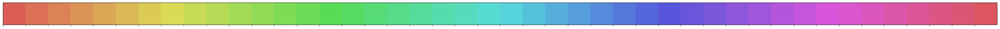

In [17]:
n_class = len(class_list)
palette = sns.hls_palette(n_class)
sns.palplot(palette)

In [18]:
import random
random.seed(1234)
random.shuffle(marker_list)
random.shuffle(palette)

In [19]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, n_iter=20000)
X_tsne_2d = tsne.fit_transform(encoding_array)

In [20]:
X_tsne_2d.shape

(8764, 2)

In [22]:
import matplotlib.pyplot as plt
%matplotlib inline

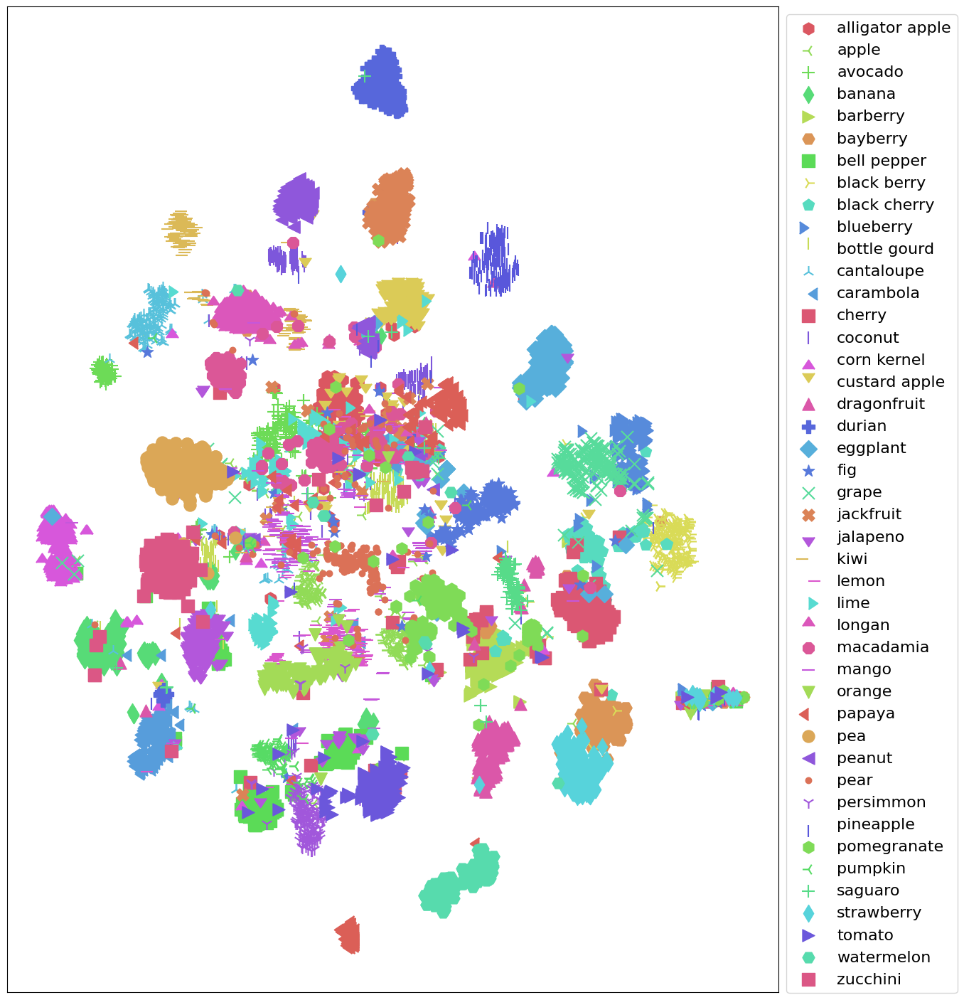

In [28]:
show_feature = 'category_name'
plt.figure(figsize=(14, 18))
for idx, fruit in enumerate(class_list):

    color = palette[idx]
    marker = marker_list[idx%len(marker_list)]

    indices = np.where(df[show_feature]==fruit)
    plt.scatter(X_tsne_2d[indices, 0], X_tsne_2d[indices, 1], color=color, marker=marker, label=fruit, s=150)

plt.legend(fontsize=16, markerscale=1, bbox_to_anchor=(1, 1))
plt.xticks([])
plt.yticks([])
plt.savefig('Visualization of t-SNE 2D downscaling.pdf', dpi=600) 
plt.show()

In [31]:
# import plotly.express as px
df_2d = pd.DataFrame()
df_2d['X'] = list(X_tsne_2d[:, 0].squeeze())
df_2d['Y'] = list(X_tsne_2d[:, 1].squeeze())
df_2d['category_name'] = df['category_name']
df_2d['predcategory'] = df['top-1-predname']
df_2d['image_path'] = df['image_path']
df_2d.to_csv('t-SNE-2D.csv', index=False)
df_2d

,X,Y,category_name,predcategory,image_path
0,-4.284791,49.852974,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/0.jpg
1,3.531539,33.624451,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/1.jpg
2,-19.837706,54.429760,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/104.jpg
3,13.350080,32.835495,alligator apple,carambola,Fruit-Project_split/val/alligator apple/11.jpg
4,15.851458,32.528980,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/126.jpg
...,...,...,...,...,...
8759,-129.952789,-55.307159,zucchini,zucchini,Fruit-Project_split/val/zucchini/972.jpg
8760,-84.535812,-17.796413,zucchini,zucchini,Fruit-Project_split/val/zucchini/979.jpg
8761,-93.911964,-22.486452,zucchini,zucchini,Fruit-Project_split/val/zucchini/99.jpg
8762,17.486692,17.545879,zucchini,bottle gourd,Fruit-Project_split/val/zucchini/994.jpg


In [34]:
!pip install plotly

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.6/15.6 MB 174.0 MB/s eta 0:00:00a 0:00:01


In [35]:
import plotly.express as px
fig = px.scatter(df_2d, 
                 x='X', 
                 y='Y',
                 color=show_feature, 
                 labels=show_feature,
                 symbol=show_feature, 
                 hover_name='image_path',
                 opacity=0.8,
                 width=1000, 
                 height=600
                )

fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()
fig.write_html('t-SNE 2D downscaled plotly visualization.html')

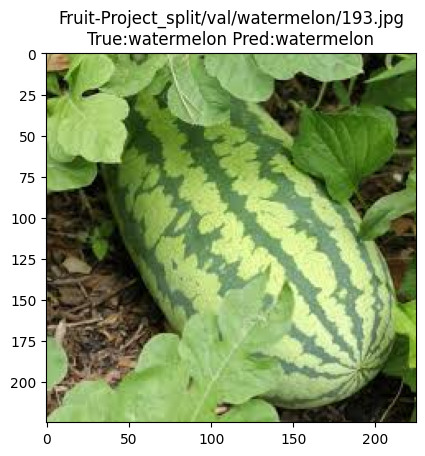

In [36]:
img_path_temp = 'Fruit-Project_split/val/watermelon/193.jpg'
img_bgr = cv2.imread(img_path_temp)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
temp_df = df[df['image_path'] == img_path_temp]
title_str = img_path_temp + '\nTrue:' + temp_df['category_name'].item() + ' Pred:' + temp_df['top-1-predname'].item()
plt.title(title_str)
plt.show()

In [37]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=3, n_iter=10000)
X_tsne_3d = tsne.fit_transform(encoding_array)

In [38]:
X_tsne_3d.shape

(8764, 3)

In [39]:
show_feature = 'category_name'
df_3d = pd.DataFrame()
df_3d['X'] = list(X_tsne_3d[:, 0].squeeze())
df_3d['Y'] = list(X_tsne_3d[:, 1].squeeze())
df_3d['Z'] = list(X_tsne_3d[:, 2].squeeze())
df_3d['category_name'] = df['category_name']
df_3d['category_name'] = df['top-1-predname']
df_3d['image_path'] = df['image_path']
df_3d.to_csv('t-SNE-3D.csv', index=False)

In [40]:
df_3d

,X,Y,Z,category_name,image_path
0,-2.598762,0.493064,1.348433,alligator apple,Fruit-Project_split/val/alligator apple/0.jpg
1,6.696814,6.799873,3.923553,alligator apple,Fruit-Project_split/val/alligator apple/1.jpg
2,4.795967,17.999397,2.911739,alligator apple,Fruit-Project_split/val/alligator apple/104.jpg
3,4.593780,7.693032,10.456852,carambola,Fruit-Project_split/val/alligator apple/11.jpg
4,5.186177,6.148426,10.058694,alligator apple,Fruit-Project_split/val/alligator apple/126.jpg
...,...,...,...,...,...
8759,-22.931185,-9.041798,-1.607371,zucchini,Fruit-Project_split/val/zucchini/972.jpg
8760,-17.390114,-11.397635,9.540705,zucchini,Fruit-Project_split/val/zucchini/979.jpg
8761,-15.393277,-5.390993,10.645911,zucchini,Fruit-Project_split/val/zucchini/99.jpg
8762,-3.598207,0.829663,11.147947,bottle gourd,Fruit-Project_split/val/zucchini/994.jpg


In [41]:
fig = px.scatter_3d(df_3d, 
                    x='X', 
                    y='Y', 
                    z='Z',
                    color=show_feature, 
                    labels=show_feature,
                    symbol=show_feature, 
                    hover_name='image_path',
                    opacity=0.6,
                    width=1000, 
                    height=800)

fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()
fig.write_html('t-SNE 3D downscaled plotly visualization.html')

# UMAP

In [85]:
! pip install umap-learn datashader bokeh holoviews scikit-image colorcet

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


In [86]:
encoding_array = np.load('Test set semantic features.npy', allow_pickle=True)
encoding_array.shape

(8764, 2048)

In [87]:
df = pd.read_csv('predict result.csv')
df.head()

,image_path,category_ID,category_name,top-1-predID,top-1-predname,top-2-predID,top-2-predname,top-3-predID,top-3-predname,top-npred_accuracy,...,pear-pred_confidence,persimmon-pred_confidence,pineapple-pred_confidence,pomegranate-pred_confidence,pumpkin-pred_confidence,saguaro-pred_confidence,strawberry-pred_confidence,tomato-pred_confidence,watermelon-pred_confidence,zucchini-pred_confidence
0,Fruit-Project_split/val/alligator apple/0.jpg,0,alligator apple,0,alligator apple,31,papaya,29,mango,True,...,0.000103,9.461980e-08,9.112241e-09,0.000008,2.028434e-11,2.603441e-05,9.726789e-10,6.969814e-09,1.002606e-09,3.178858e-09
1,Fruit-Project_split/val/alligator apple/1.jpg,0,alligator apple,0,alligator apple,12,carambola,16,custard apple,True,...,0.008939,1.829909e-05,3.816224e-05,0.002383,2.628836e-08,1.028068e-06,1.082151e-05,3.908504e-05,1.129323e-08,3.850660e-06
2,Fruit-Project_split/val/alligator apple/104.jpg,0,alligator apple,0,alligator apple,16,custard apple,26,lime,True,...,0.000072,8.915411e-09,1.094528e-09,0.000013,1.463985e-12,1.096894e-09,5.980939e-08,2.283745e-08,6.226919e-12,7.016864e-11
3,Fruit-Project_split/val/alligator apple/11.jpg,0,alligator apple,12,carambola,25,lemon,37,pomegranate,False,...,0.011314,9.744614e-06,2.091753e-05,0.149423,3.197897e-05,3.918293e-08,1.287887e-04,2.304227e-03,1.335809e-03,1.345585e-04
4,Fruit-Project_split/val/alligator apple/126.jpg,0,alligator apple,0,alligator apple,22,jackfruit,16,custard apple,True,...,0.009822,3.829435e-05,4.677585e-07,0.000390,1.177173e-05,5.129017e-08,1.970630e-05,4.915302e-05,4.212683e-06,4.816151e-05


In [88]:
classes = df['category_name'].unique()
print(classes)

['alligator apple' 'apple' 'avocado' 'banana' 'barberry' 'bayberry'
 'bell pepper' 'black berry' 'black cherry' 'blueberry' 'bottle gourd'
 'cantaloupe' 'carambola' 'cherry' 'coconut' 'corn kernel' 'custard apple'
 'dragonfruit' 'durian' 'eggplant' 'fig' 'grape' 'jackfruit' 'jalapeno'
 'kiwi' 'lemon' 'lime' 'longan' 'macadamia' 'mango' 'orange' 'papaya'
 'pea' 'peanut' 'pear' 'persimmon' 'pineapple' 'pomegranate' 'pumpkin'
 'saguaro' 'strawberry' 'tomato' 'watermelon' 'zucchini']


In [89]:
import seaborn as sns
marker_list = ['.', ',', 'o', 'v', '^', '<', '>', '1', '2', '3', '4', '8', 's', 'p', 'P', '*', 'h', 'H', '+', 'x', 'X', 'D', 'd', '|', '_', 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
class_list = np.unique(df['category_name'])
class_list

array(['alligator apple', 'apple', 'avocado', 'banana', 'barberry',
       'bayberry', 'bell pepper', 'black berry', 'black cherry',
       'blueberry', 'bottle gourd', 'cantaloupe', 'carambola', 'cherry',
       'coconut', 'corn kernel', 'custard apple', 'dragonfruit', 'durian',
       'eggplant', 'fig', 'grape', 'jackfruit', 'jalapeno', 'kiwi',
       'lemon', 'lime', 'longan', 'macadamia', 'mango', 'orange',
       'papaya', 'pea', 'peanut', 'pear', 'persimmon', 'pineapple',
       'pomegranate', 'pumpkin', 'saguaro', 'strawberry', 'tomato',
       'watermelon', 'zucchini'], dtype=object)

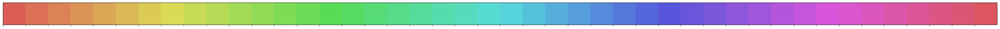

In [90]:
n_class = len(class_list) 
palette = sns.hls_palette(n_class)
sns.palplot(palette)

In [91]:
import random
random.seed(1234)
random.shuffle(marker_list)
random.shuffle(palette)

In [92]:
import umap
import umap.plot
mapper = umap.UMAP(n_neighbors=10, n_components=2, random_state=12).fit(encoding_array)
mapper.embedding_.shape

(8764, 2)

In [93]:
X_umap_2d = mapper.embedding_
X_umap_2d.shape

(8764, 2)

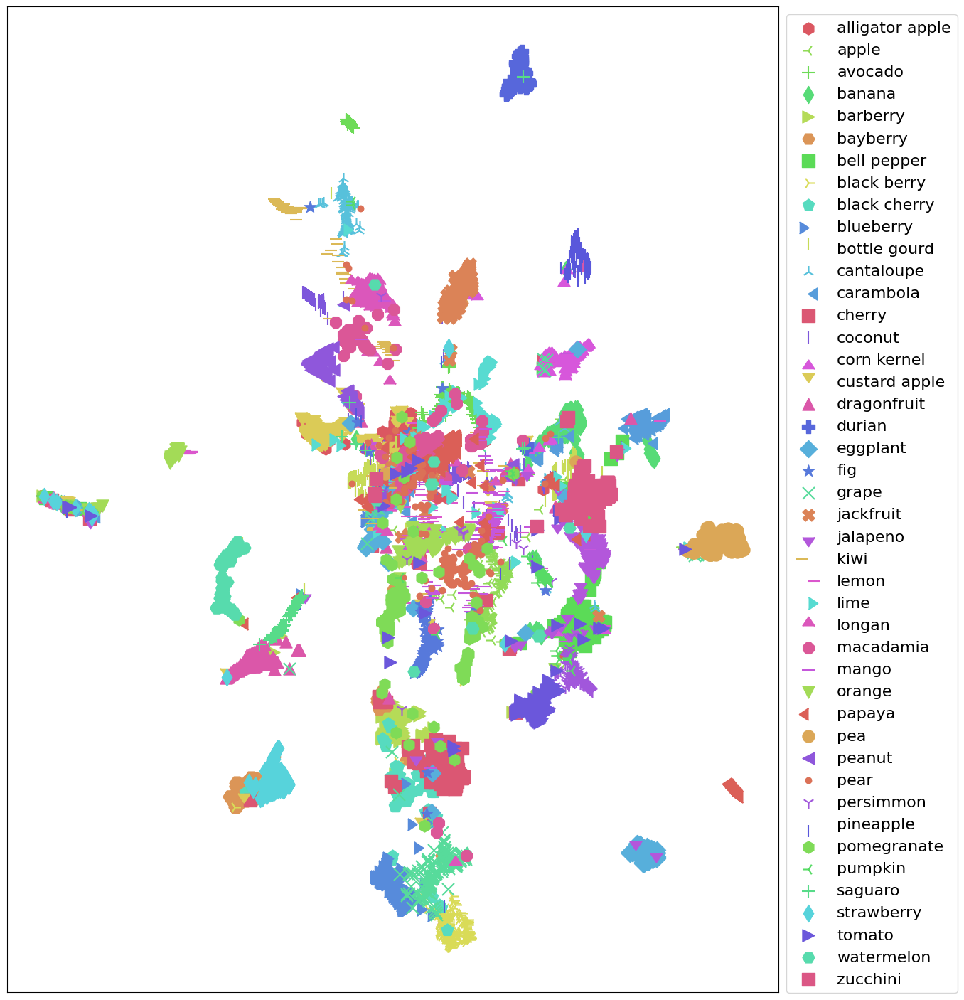

In [94]:
show_feature = 'category_name'
plt.figure(figsize=(14, 18))
for idx, fruit in enumerate(class_list):
    
    color = palette[idx]
    marker = marker_list[idx%len(marker_list)]

    indices = np.where(df[show_feature]==fruit)
    plt.scatter(X_umap_2d[indices, 0], X_umap_2d[indices, 1], color=color, marker=marker, label=fruit, s=150)

plt.legend(fontsize=16, markerscale=1, bbox_to_anchor=(1, 1))
plt.xticks([])
plt.yticks([])
plt.savefig('UMAP 2D downscaling visualization.pdf', dpi=600)
plt.show()

In [95]:
import cv2
import torch
from PIL import Image
from torchvision import transforms

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

model = torch.load('checkpoint/best-0.936.pth')
model = model.eval().to(device)

from torchvision.models.feature_extraction import create_feature_extractor
model_trunc = create_feature_extractor(model, return_nodes={'avgpool': 'semantic_feature'})

test_transform = transforms.Compose([transforms.Resize(256),
                                     transforms.CenterCrop(224),
                                     transforms.ToTensor(),
                                     transforms.Normalize(
                                         mean=[0.485, 0.456, 0.406], 
                                         std=[0.229, 0.224, 0.225])
                                    ])

In [104]:
img_path01 = 'Fruit-Project_split/test/banana/1039.jpg'
img_pil = Image.open(img_path01)
input_img = test_transform(img_pil)
input_img = input_img.unsqueeze(0).to(device)
pred_logits = model_trunc(input_img)
semantic_feature = pred_logits['semantic_feature'].squeeze().detach().cpu().numpy().reshape(1,-1)

In [105]:
semantic_feature.shape

(1, 2048)

In [106]:
new_embedding = mapper.transform(semantic_feature)[0]
new_embedding

array([14.148141,  5.799336], dtype=float32)

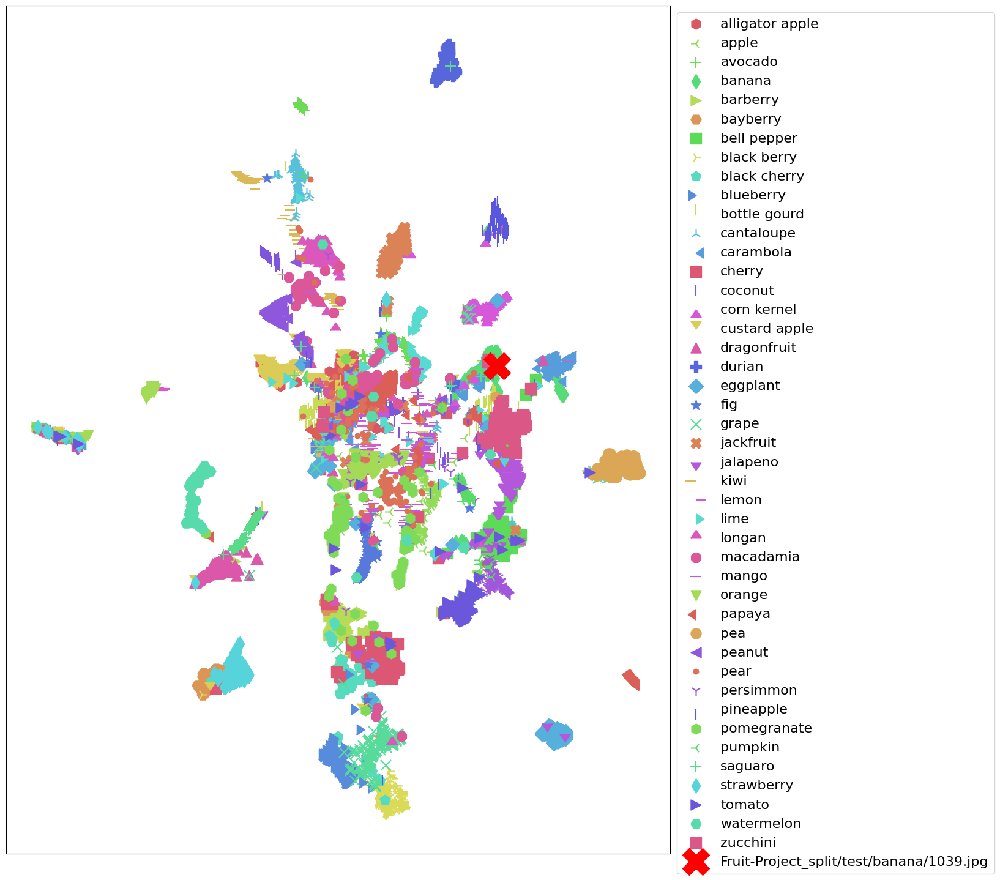

In [107]:
plt.figure(figsize=(14, 18))
for idx, fruit in enumerate(class_list):
    color = palette[idx]
    marker = marker_list[idx%len(marker_list)]

    indices = np.where(df[show_feature]==fruit)
    plt.scatter(X_umap_2d[indices, 0], X_umap_2d[indices, 1], color=color, marker=marker, label=fruit, s=150)

plt.scatter(new_embedding[0], new_embedding[1], color='r', marker='X', label=img_path, s=1000)

plt.legend(fontsize=16, markerscale=1, bbox_to_anchor=(1, 1))
plt.xticks([])
plt.yticks([])
plt.savefig('UMAP 2D downscaling visualization - new image.pdf', dpi=600) 
plt.show()

In [108]:
# import plotly.express as px
df_2d = pd.DataFrame()
df_2d['X'] = list(X_umap_2d[:, 0].squeeze())
df_2d['Y'] = list(X_umap_2d[:, 1].squeeze())
df_2d['category_name'] = df['category_name']
df_2d['predcategory'] = df['top-1-predname']
df_2d['image_path'] = df['image_path']
df_2d.to_csv('UMAP-2D.csv', index=False)

In [110]:
new_img_row = {
    'X':new_embedding[0],
    'Y':new_embedding[1],
    'category_name':img_path,
    'image_path':img_path01
}
new_df_row = pd.DataFrame([new_img_row])
df_2d = pd.concat([df_2d, new_df_row], ignore_index=True)
df_2d

,X,Y,category_name,predcategory,image_path
0,8.513105,5.060289,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/0.jpg
1,8.653939,4.107865,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/1.jpg
2,8.611531,6.018968,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/104.jpg
3,8.175819,3.664591,alligator apple,carambola,Fruit-Project_split/val/alligator apple/11.jpg
4,8.336414,3.852484,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/126.jpg
...,...,...,...,...,...
8761,14.255948,3.629441,zucchini,zucchini,Fruit-Project_split/val/zucchini/99.jpg
8762,14.070470,3.765496,zucchini,bottle gourd,Fruit-Project_split/val/zucchini/994.jpg
8763,14.191362,3.597372,zucchini,zucchini,Fruit-Project_split/val/zucchini/996.jpg
8764,14.148141,5.799336,Fruit-Project_split/test/banana/1039.jpg,NaN,Fruit-Project_split/test/banana/1039.jpg


In [111]:
fig = px.scatter(df_2d, 
                 x='X', 
                 y='Y',
                 color=show_feature, 
                 labels=show_feature,
                 symbol=show_feature, 
                 hover_name='image_path',
                 opacity=0.8,
                 width=1000, 
                 height=600
                )
# 设置排版
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()
fig.write_html('UMAP 2D downscaling plotly visualization.html')

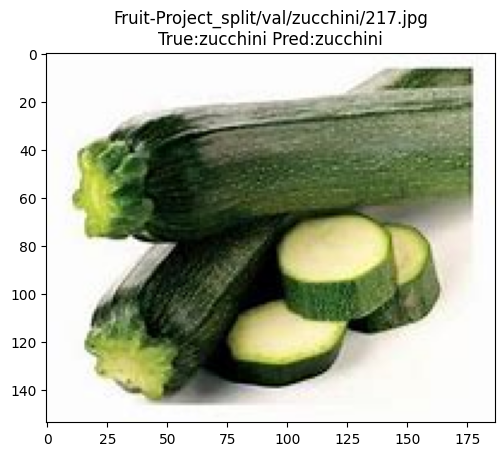

In [121]:
img_path_temp = 'Fruit-Project_split/val/zucchini/217.jpg'
img_bgr = cv2.imread(img_path_temp)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
temp_df = df[df['image_path'] == img_path_temp]
title_str = img_path_temp + '\nTrue:' + temp_df['category_name'].item() + ' Pred:' + temp_df['top-1-predname'].item()
plt.title(title_str)
plt.show()

# img_path_temp = 'Fruit-Project_split/test/banana/1039.jpg'
# img_bgr = cv2.imread(img_path_temp)
# img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
# plt.imshow(img_rgb)
# temp_df = df[df['image_path'] == img_path_temp]
# title_str = img_path_temp + '\nTrue:' + temp_df['category_name'].item() + ' Pred:' + temp_df['top-1-predname'].item()
# plt.title(title_str)
# plt.show()